In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 데이터 확인

## 데이터 불러오기

In [2]:
df = pd.read_csv('C:/Users/Playdata/Desktop/미니프젝1/archive/telecom_customer_churn.csv', encoding='euc-kr')

In [3]:
# 데이터 shape 파악
df.shape

(7043, 38)

In [4]:
# 데이터 통계량 파악
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [5]:
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [6]:
# 변수명 변경
df.rename(lambda x: x.lower().strip().replace(' ', '_'), axis='columns', inplace=True)

In [7]:
df.dtypes

customer_id                           object
gender                                object
age                                    int64
married                               object
number_of_dependents                   int64
city                                  object
zip_code                               int64
latitude                             float64
longitude                            float64
number_of_referrals                    int64
tenure_in_months                       int64
offer                                 object
phone_service                         object
avg_monthly_long_distance_charges    float64
multiple_lines                        object
internet_service                      object
internet_type                         object
avg_monthly_gb_download              float64
online_security                       object
online_backup                         object
device_protection_plan                object
premium_tech_support                  object
streaming_

In [86]:
# 관련없는 데이터 삭제
df.drop(columns = ['customer_id', 'zip_code', 'latitude', 'longitude'], inplace = True)

In [91]:
df.columns

Index(['gender', 'age', 'married', 'number_of_dependents', 'city',
       'number_of_referrals', 'tenure_in_months', 'offer', 'phone_service',
       'avg_monthly_long_distance_charges', 'multiple_lines',
       'internet_service', 'internet_type', 'avg_monthly_gb_download',
       'online_security', 'online_backup', 'device_protection_plan',
       'premium_tech_support', 'streaming_tv', 'streaming_movies',
       'streaming_music', 'unlimited_data', 'contract', 'paperless_billing',
       'payment_method', 'monthly_charge', 'total_charges', 'total_refunds',
       'total_extra_data_charges', 'total_long_distance_charges',
       'total_revenue', 'customer_status', 'churn_category', 'churn_reason',
       'churn'],
      dtype='object')

# 2-1. 데이터 전처리

### 데이터 타입 변경

In [8]:
# 데이터 전처리_범주형_명목형_수치 맵핑
# male -> 0, female -> 1로 변환
df = df.replace({'Male':0, 'Female':1})
df['gender']

0       1
1       0
2       0
3       0
4       1
       ..
7038    1
7039    0
7040    0
7041    0
7042    0
Name: gender, Length: 7043, dtype: int64

### churn(이탈여부 yes/no) 컬럼 추가
- customer_status = churned : yes
- customer_status = joined, stayed : no

In [9]:
df['churn'] = np.where(df['customer_status'] == 'Churned', 'Yes', 'No')

In [10]:
df['churn']

0        No
1        No
2       Yes
3       Yes
4       Yes
       ... 
7038     No
7039    Yes
7040     No
7041     No
7042     No
Name: churn, Length: 7043, dtype: object

## 결측치

In [11]:
# 결측치 개수 파악
# 셀 실행 결과를 데이터프레임으로 보고 싶을 때 to_frame()과 pd.DataFrame() 두 가지를 사용 가능
df.isnull().sum().to_frame('nan_count')

,nan_count
customer_id,0
gender,0
age,0
married,0
number_of_dependents,0
city,0
zip_code,0
latitude,0
longitude,0
number_of_referrals,0


In [12]:
# 결측치 비율 파악
pd.DataFrame(data=df.isnull().sum()/len(df), columns=['nan_ratio'])

,nan_ratio
customer_id,0.000000
gender,0.000000
age,0.000000
married,0.000000
number_of_dependents,0.000000
city,0.000000
zip_code,0.000000
latitude,0.000000
longitude,0.000000
number_of_referrals,0.000000


Text(0.5, 1.0, 'Correlation with Missing Values')

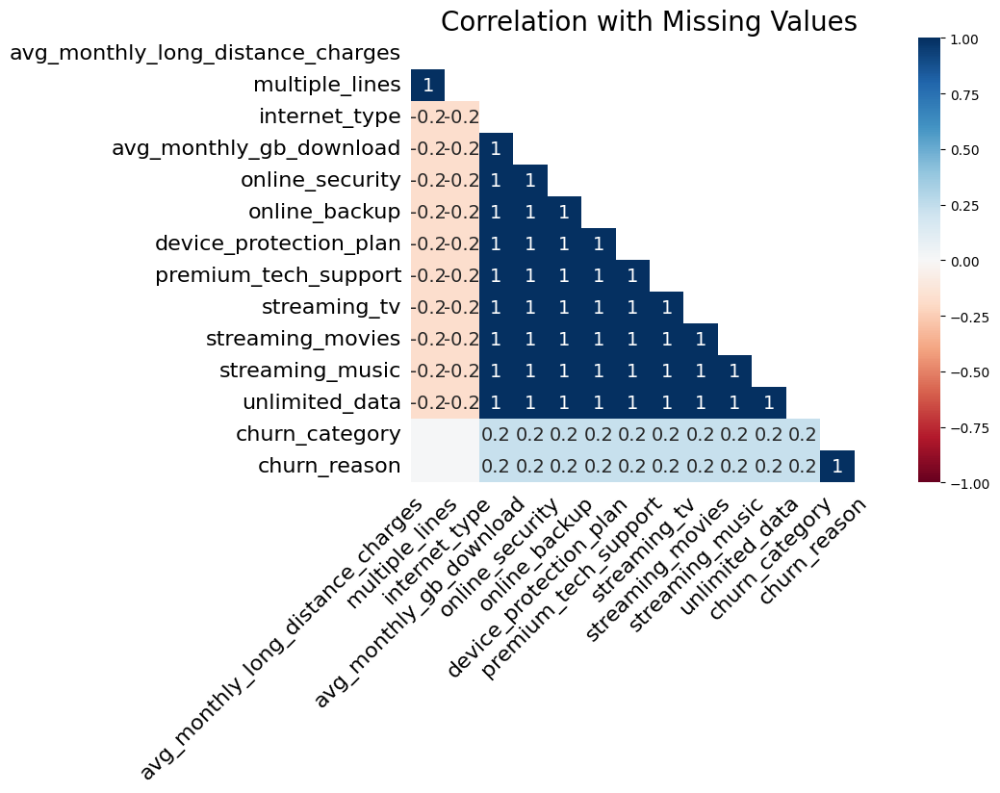

In [13]:
# 결측치끼리의 상관관계
import missingno as msno
missingdata_df = df.columns[df.isnull().any()].tolist()
msno.heatmap(df[missingdata_df], figsize=(8,6))
plt.title("Correlation with Missing Values", fontsize=20)

결측치끼리의 상관성은 없는 것을 확인할 수 있음
Churn Category, Churn Reason은 이탈을 하지않아 발생하는 Nan으로 판단하는게 옳다고 생각함
그외 결측치는 인터넷 혹은 폰 서비스를 이용하지 않고 발생하는 단순 누락으로 인한 Nan으로 판단하는게 옳다고 생각함


## 중복값

In [14]:
df.shape

(7043, 39)

In [15]:
print(df.duplicated('customer_id', keep=False).sum())

0


고객명으로 중복확인시 중복값 없음을 알 수 있음

## 상관관계

In [16]:
# 상관계수 계산하기
raw = df.corr()
raw

C:\Users\Playdata\AppData\Local\Temp\ipykernel_8184\1873500631.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  raw = df.corr()


,gender,age,number_of_dependents,zip_code,latitude,longitude,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue
gender,1.000000,-0.002186,-0.005840,-0.021058,-0.013070,0.013217,0.009074,-0.005162,-0.016004,0.014481,0.020073,0.000152,-0.004725,0.001921,-0.011092,-0.003127
age,-0.002186,1.000000,-0.119000,-0.008183,-0.010305,0.007612,-0.025141,0.009927,-0.020010,-0.566518,0.134511,0.059684,0.024168,0.025036,0.003065,0.048265
number_of_dependents,-0.005840,-0.119000,1.000000,0.016493,0.029081,-0.024271,0.278003,0.108237,-0.002898,0.300802,-0.125649,0.022535,0.014023,-0.014436,0.068966,0.038038
zip_code,-0.021058,-0.008183,0.016493,1.000000,0.894769,-0.790564,0.001463,0.007146,0.012298,-0.002859,-0.002517,0.001978,-0.003797,-0.014550,0.005063,0.002944
latitude,-0.013070,-0.010305,0.029081,0.894769,1.000000,-0.885979,0.018715,0.011963,0.014450,-0.013485,-0.021613,-0.002784,-0.009901,-0.013233,0.008029,0.000082
longitude,0.013217,0.007612,-0.024271,-0.790564,-0.885979,1.000000,-0.009893,-0.009672,-0.015420,0.015195,0.021052,0.003811,-0.000597,0.010461,-0.006923,0.001062
number_of_referrals,0.009074,-0.025141,0.278003,0.001463,0.018715,-0.009893,1.000000,0.326975,0.001800,0.080243,0.026301,0.250378,0.024756,0.000350,0.216190,0.261853
tenure_in_months,-0.005162,0.009927,0.108237,0.007146,0.011963,-0.009672,0.326975,1.000000,0.012713,0.038173,0.239065,0.826074,0.059021,0.082266,0.674149,0.853146
avg_monthly_long_distance_charges,-0.016004,-0.020010,-0.002898,0.012298,0.014450,-0.015420,0.001800,0.012713,1.000000,0.019047,0.019149,0.016946,-0.026072,0.021162,0.548759,0.173072
avg_monthly_gb_download,0.014481,-0.566518,0.300802,-0.002859,-0.013485,0.015195,0.080243,0.038173,0.019047,1.000000,-0.017283,0.031957,-0.011000,0.015451,0.024101,0.031922


C:\Users\Playdata\AppData\Local\Temp\ipykernel_8184\2247443539.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  raw = df.corr()


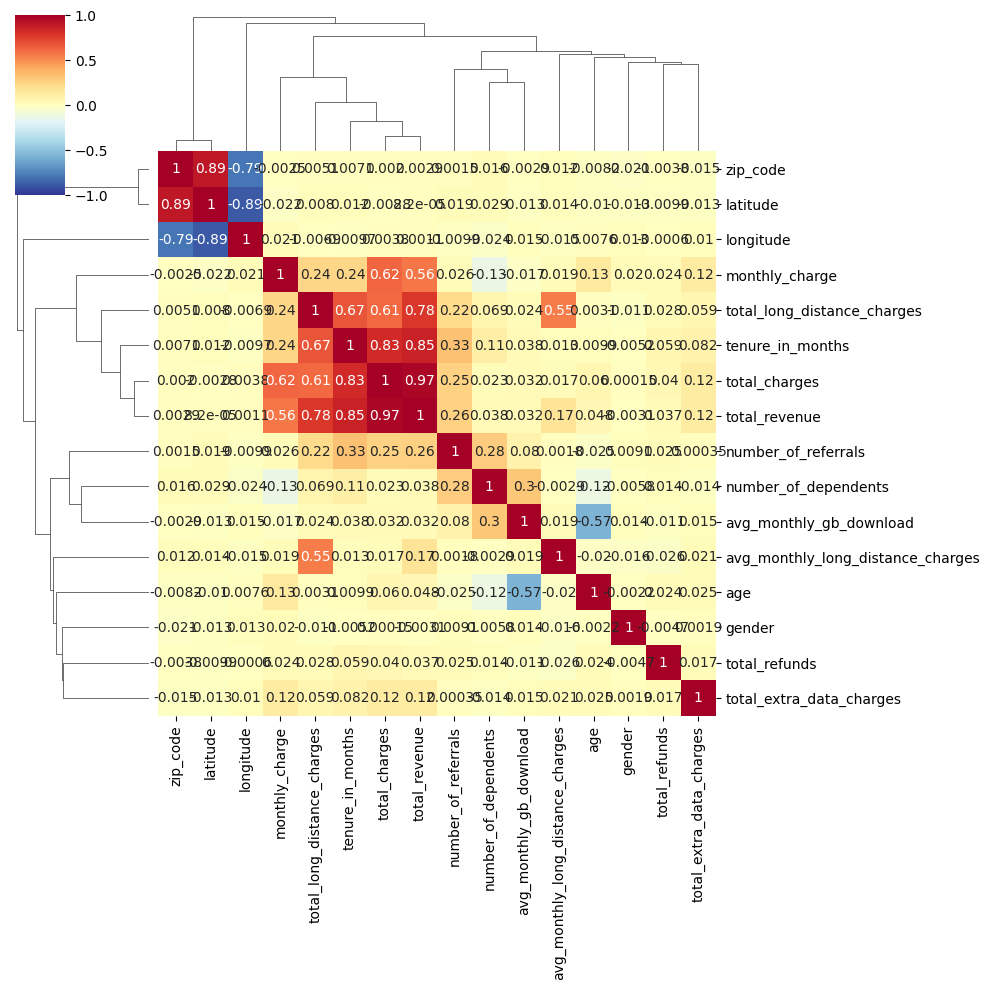

In [17]:
# 상관계수 시각화
raw = df.corr()
sns.clustermap(raw,
              annot = True,     # 실제 값 화면에 나타내기
              cmap = 'RdYlBu_r',  # Red, Yellow, Blue 색상으로 표시
              vmin = -1, vmax = 1, # 컬러차트 -1 ~ 1 범위로 표시
              )

C:\Users\Playdata\AppData\Local\Temp\ipykernel_8184\3898000989.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  raw = df.corr()
C:\Users\Playdata\AppData\Local\Temp\ipykernel_8184\3898000989.py:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(raw, dtype=np.bool)


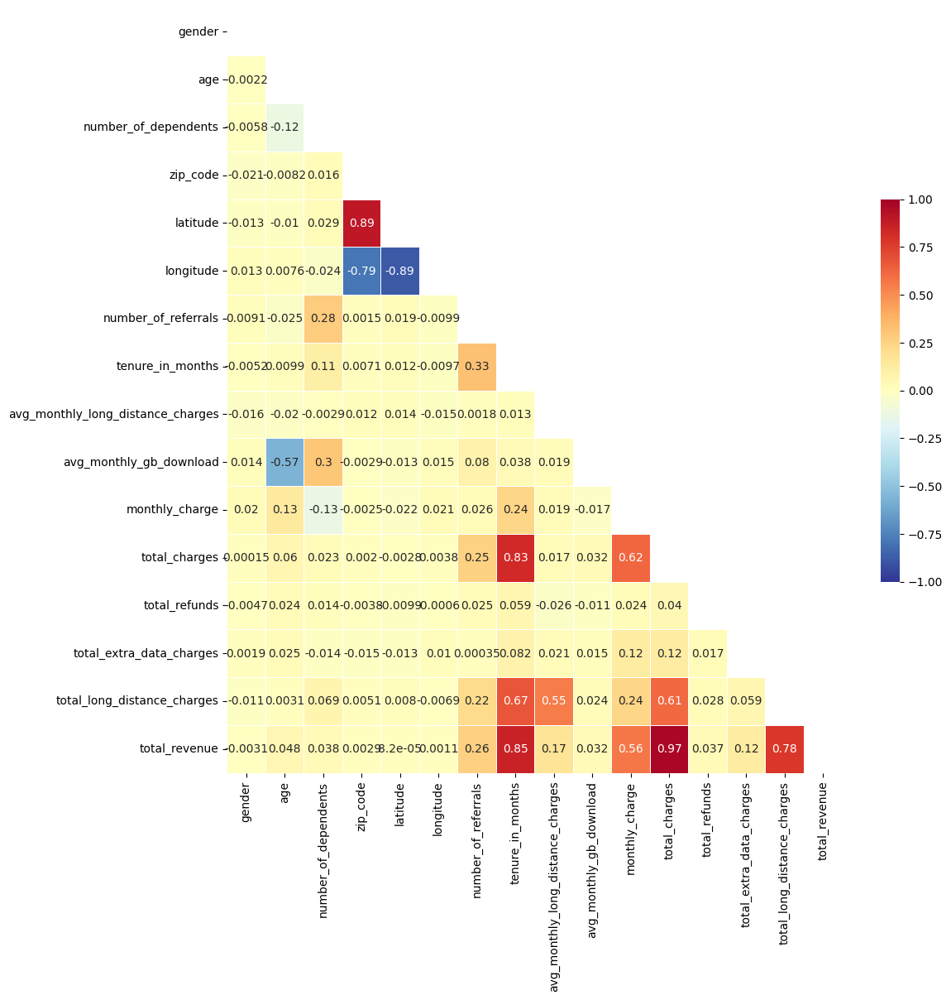

In [18]:
# sns.heatmap 삼각형으로 만들기
# (항상 1이 되는) 대각선 부분도 함께 제거

raw = df.corr()
# 그림 사이즈 지정
fig, ax = plt.subplots(figsize=(12,12))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(raw, dtype=np.bool)
mask[np.triu_indices_from(mask)]=True

# 히트맵 그림
sns.heatmap(raw,
           cmap = 'RdYlBu_r',
           annot = True,       # 실제 값을 표시
           mask = mask,        # 표시하지 않을 마스크 부분을 지정
           linewidths=.5,      # 경계면 실선으로 구분
           cbar_kws={"shrink": .5},     # 컬러바 크기 절반으로 줄이기
           vmin = -1, vmax = 1          # 컬러바 범위 -1 ~ 1
           )
plt.show()

# 2-2. 데이터 시각화

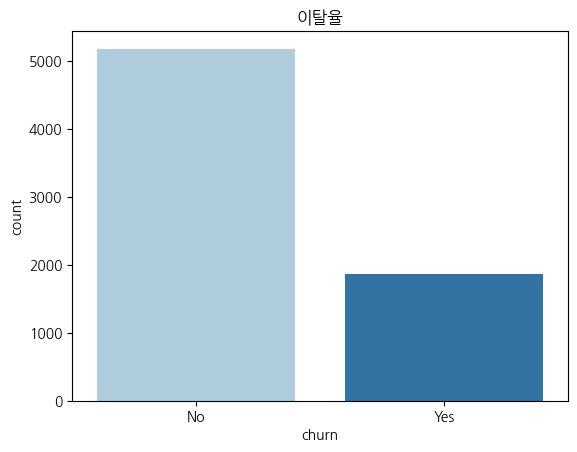

In [32]:
# 이탈율
sns.countplot(x = 'churn', data=df, palette='Paired')
plt.title('이탈율')
plt.show()

<AxesSubplot: xlabel='count', ylabel='churn_reason'>

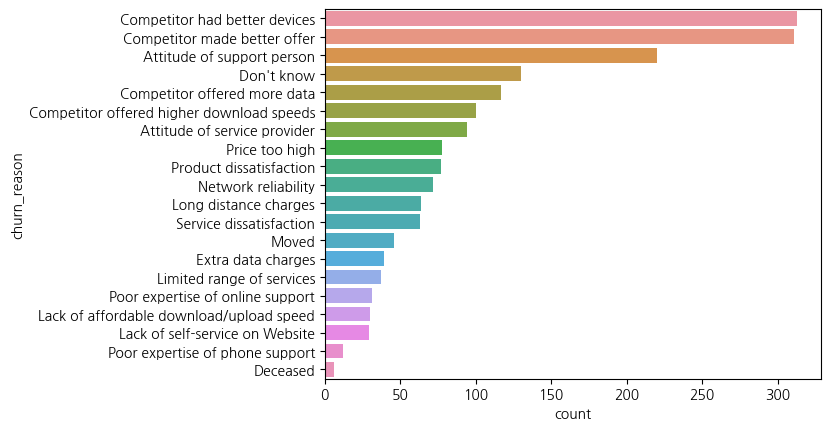

In [38]:
# 이탈 여부 이유 count
sns.countplot(data = df, y = 'churn_reason', order = df['churn_reason'].value_counts().index)
# order 사용하여 내림차순으로 정렬

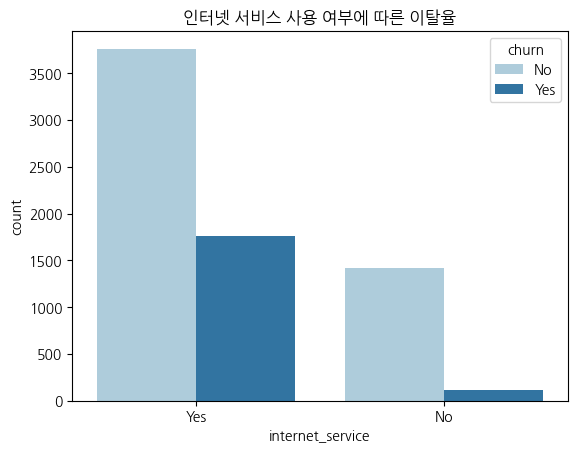

In [39]:
# 인터넷 서비스 사용 여부에 따른 이탈율
sns.countplot(x = 'internet_service', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('인터넷 서비스 사용 여부에 따른 이탈율')         # 그래프 이름 설정
plt.show()

인터넷 서비스에 가입하면 이탈율이 높아집니다.

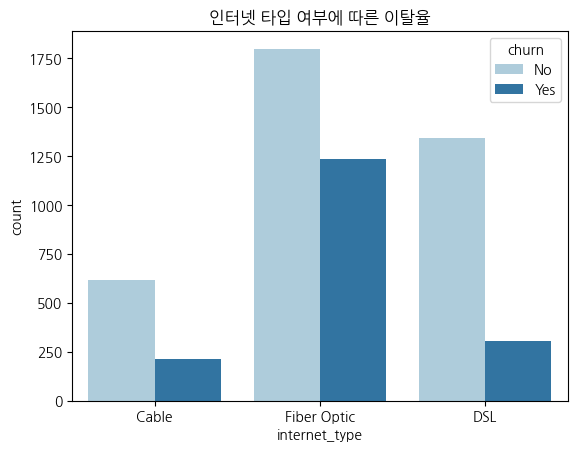

In [101]:
# 인터넷 타입에 따른 이탈율
sns.countplot(x = 'internet_type', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('인터넷 타입 여부에 따른 이탈율')         # 그래프 이름 설정
plt.show()

다양한 인터넷 연결 유형 중 Fiber Optic이 가장 널리 사용됨.

Cable 및 DSL에 비해 가격이 비싸더라도 다운로드 및 업로드 속도가 가장 빠르기 때문임

그러나 연결 서비스를 중단할 가능성이 가장 높음

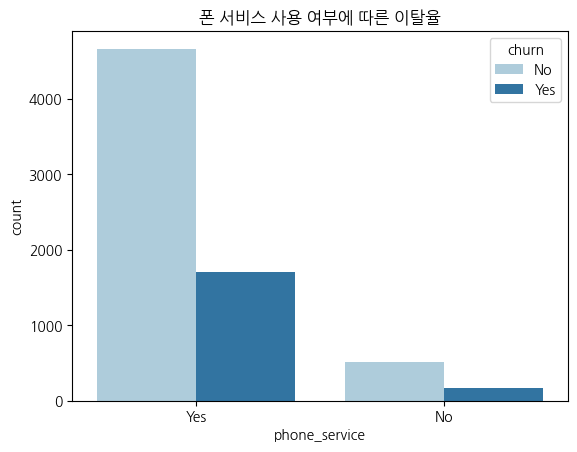

In [40]:
# 폰 서비스 사용 여부에 따른 이탈율
sns.countplot(x = 'phone_service', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('폰 서비스 사용 여부에 따른 이탈율')         # 그래프 이름 설정
plt.show()

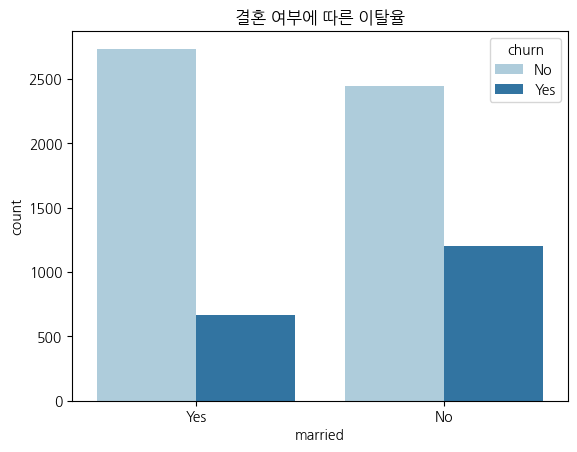

In [20]:
# 결혼 여부에 따른 이탈율
sns.countplot(x = 'married', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('결혼 여부에 따른 이탈율')         # 그래프 이름 설정
plt.show()

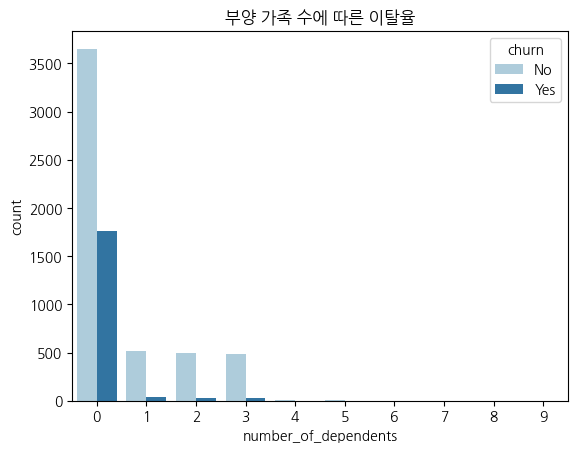

In [21]:
# 부양 가족 수에 따른 이탈율
sns.countplot(x = 'number_of_dependents', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('부양 가족 수에 따른 이탈율')         # 그래프 이름 설정
plt.show()

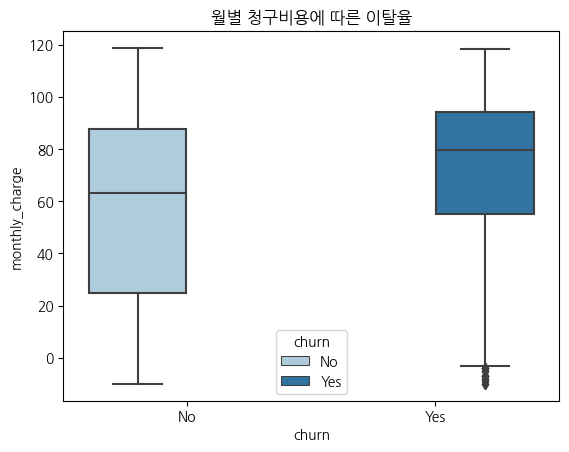

In [25]:
# 월별 청구비용에 따른 이탈율
sns.boxplot(x='churn', y="monthly_charge", hue="churn", data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title("월별 청구비용에 따른 이탈율")
plt.show()

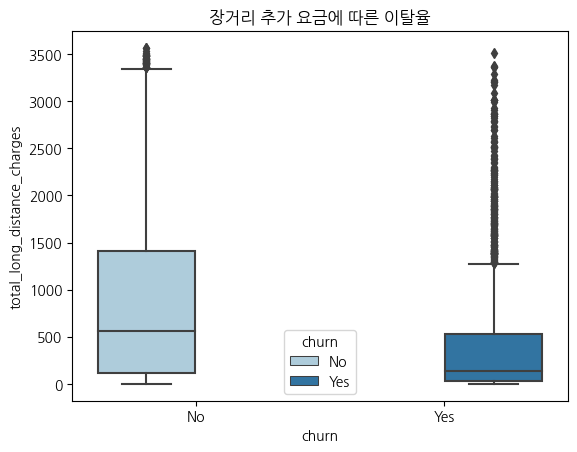

In [27]:
# 장거리 추가 요금에 따른 이탈율
sns.boxplot(x='churn', y="total_long_distance_charges", hue="churn", data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title("장거리 추가 요금에 따른 이탈율")
plt.show()

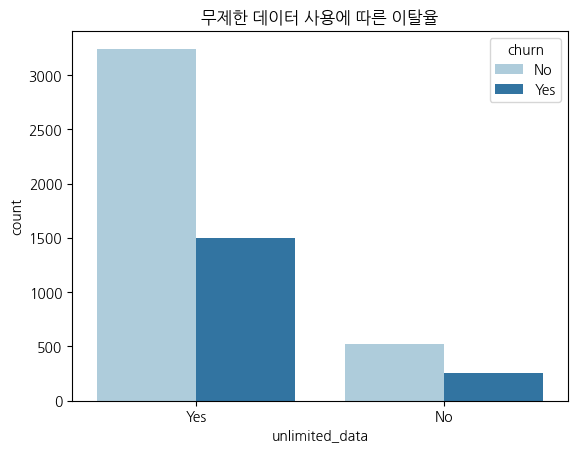

In [81]:
# 무제한 데이터 사용에 따른 이탈율
sns.countplot(x = 'unlimited_data', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('무제한 데이터 사용에 따른 이탈율')         # 그래프 이름 설정
plt.show()

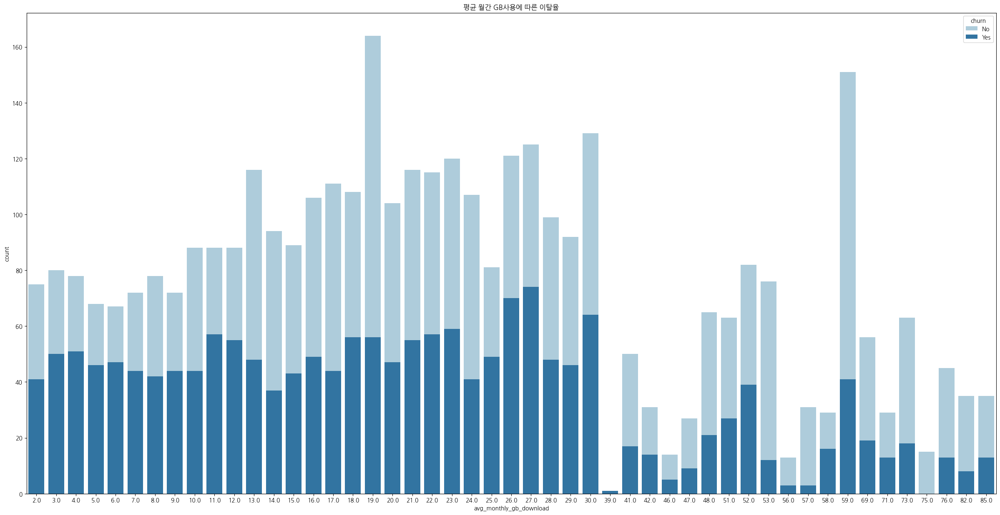

In [48]:
# 평균 월간 GB사용에 따른 이탈율
plt.subplots(figsize=(30,15))
sns.countplot(x = 'avg_monthly_gb_download', hue = 'churn', data=df, palette='Paired', dodge=False)
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('평균 월간 GB사용에 따른 이탈율')         # 그래프 이름 설정
plt.show()

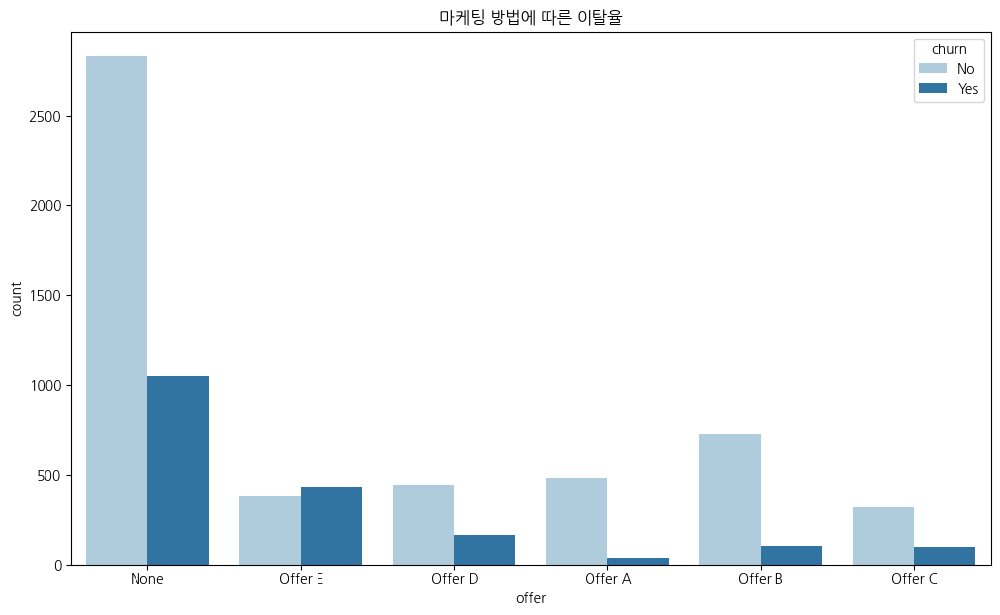

In [57]:
# 마케팅 방법에 따른 이탈율
plt.subplots(figsize=(12,7))
sns.countplot(x = 'offer', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('마케팅 방법에 따른 이탈율')         # 그래프 이름 설정
plt.show()

대부분의 고객은 마케팅 제안을 수락하지 않았습니다.

기업은 낮은 마케팅율을 개선하기를 바랄 수 있습니다.

마케팅 제안 E를 구독한 후 높은 고객 이탈률을 관찰했습니다.

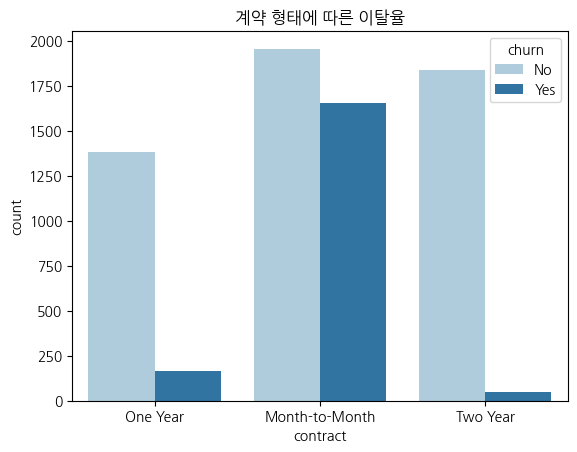

In [82]:
# 계약 형태에 따른 이탈율
sns.countplot(x = 'contract', hue = 'churn', data=df, palette='Paired')
plt.rcParams['font.family'] = 'NanumGothic'  # 폰트설정
plt.rc('axes', unicode_minus=False)         # 마이너스 깨짐 현상
plt.title('계약 형태에 따른 이탈율')         # 그래프 이름 설정
plt.show()

월 단위로 지불하는 사용자는 이탈할 가능성이 높음

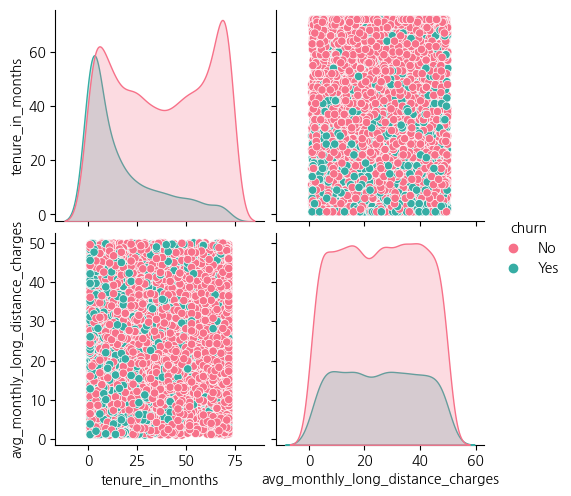

In [93]:
# 계약 유지 기간,평균 월간 장거리 요금에 따른 이탈율
sns.pairplot(df, hue='churn', palette='husl', vars=['tenure_in_months', 'avg_monthly_long_distance_charges'])
plt.show()

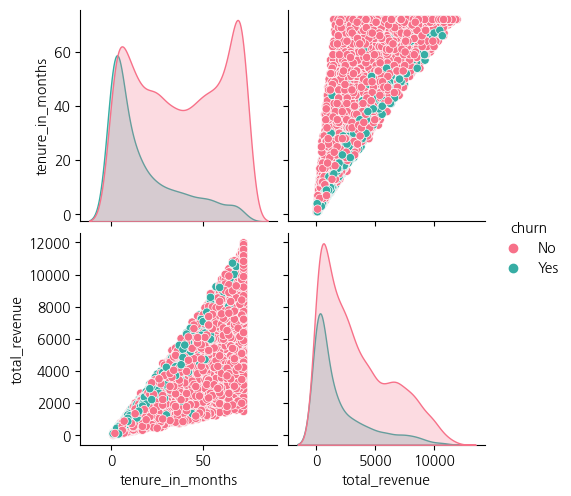

In [85]:
# 계약유지기간, 총수익에 따른 이탈율
sns.pairplot(df, hue='churn', palette='husl', vars=['tenure_in_months', 'total_revenue'])
plt.show()

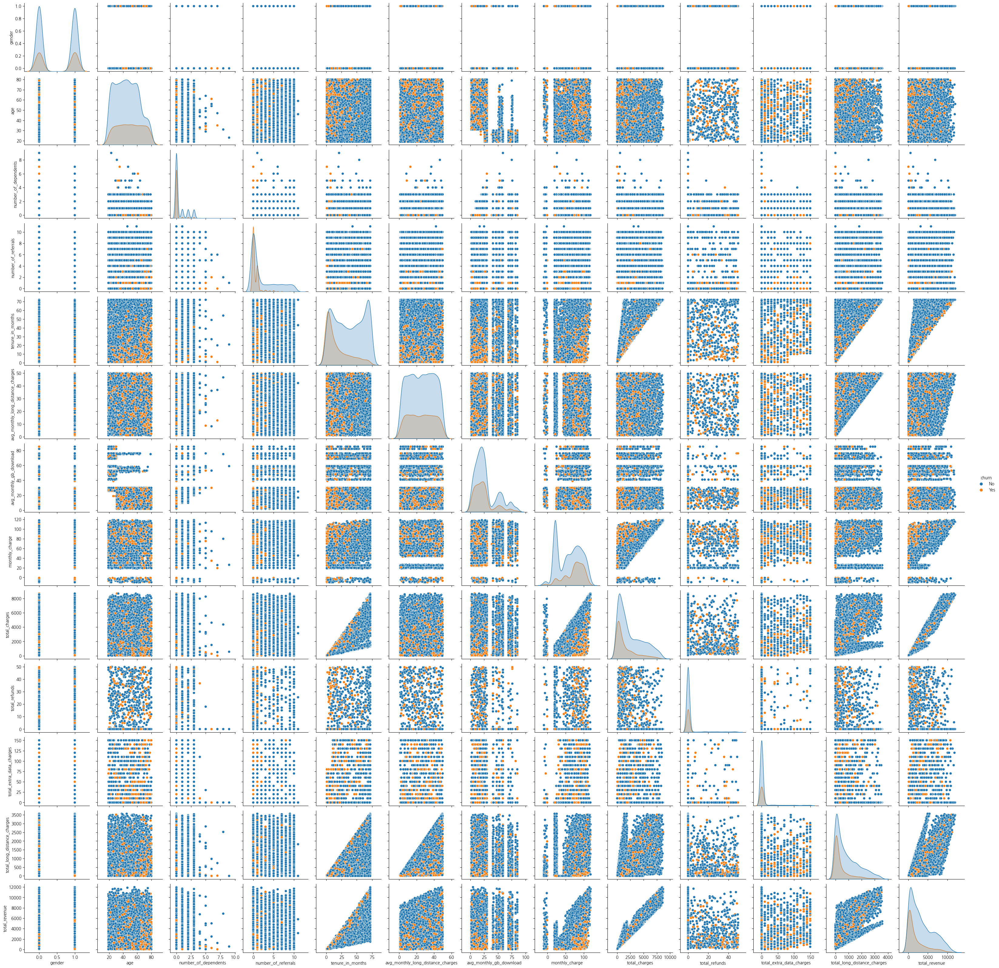

In [100]:
sns.pairplot(df, hue='churn')
plt.show()

gender                                  AxesSubplot(0.125,0.786098;0.133621x0.0939024)
age                                  AxesSubplot(0.285345,0.786098;0.133621x0.0939024)
number_of_dependents                  AxesSubplot(0.44569,0.786098;0.133621x0.0939024)
number_of_referrals                  AxesSubplot(0.606034,0.786098;0.133621x0.0939024)
tenure_in_months                     AxesSubplot(0.766379,0.786098;0.133621x0.0939024)
avg_monthly_long_distance_charges       AxesSubplot(0.125,0.673415;0.133621x0.0939024)
avg_monthly_gb_download              AxesSubplot(0.285345,0.673415;0.133621x0.0939024)
monthly_charge                        AxesSubplot(0.44569,0.673415;0.133621x0.0939024)
total_charges                        AxesSubplot(0.606034,0.673415;0.133621x0.0939024)
total_refunds                        AxesSubplot(0.766379,0.673415;0.133621x0.0939024)
total_extra_data_charges                AxesSubplot(0.125,0.560732;0.133621x0.0939024)
total_long_distance_charges          AxesSu

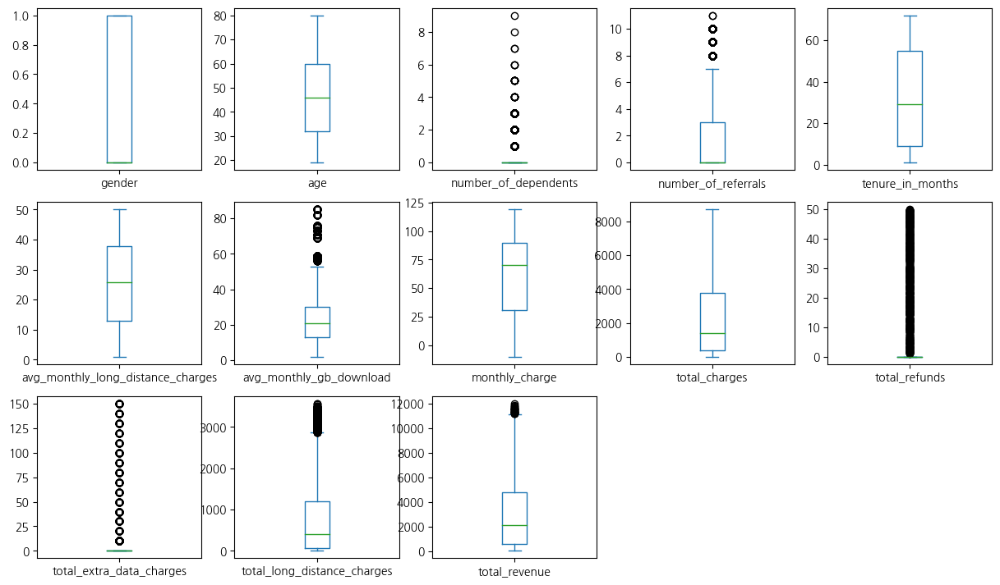

In [103]:
# 전체 범주형 변수 boxplot
df.plot(kind='box', subplots=True, layout=(7, 5), figsize=(15, 21))

In [106]:
df.plot(kind='bar', subplots=True, layout=(7, 5), figsize=(15, 21))

array([[<AxesSubplot: title={'center': 'gender'}>,
        <AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'number_of_dependents'}>,
        <AxesSubplot: title={'center': 'number_of_referrals'}>,
        <AxesSubplot: title={'center': 'tenure_in_months'}>],
       [<AxesSubplot: title={'center': 'avg_monthly_long_distance_charges'}>,
        <AxesSubplot: title={'center': 'avg_monthly_gb_download'}>,
        <AxesSubplot: title={'center': 'monthly_charge'}>,
        <AxesSubplot: title={'center': 'total_charges'}>,
        <AxesSubplot: title={'center': 'total_refunds'}>],
       [<AxesSubplot: title={'center': 'total_extra_data_charges'}>,
        <AxesSubplot: title={'center': 'total_long_distance_charges'}>,
        <AxesSubplot: title={'center': 'total_revenue'}>,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <A

Error in callback <function flush_figures at 0x000001E3013AF910> (for post_execute):



KeyboardInterrupt



In [ ]:
# 라벨 인코딩

#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique 

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

In [ ]:
# 1,0으로 바꾸기
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]

In [ ]:
def encode_data(dataframe):
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

In [ ]:
# csv파일로 저장
data.to_csv('mycsvfile.csv',index=False)